/users/hongyuz/software/anaconda3/lib/python3.5/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/users/hongyuz/software/anaconda3/lib/python3.5/site-packages/sklearn/grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)
/users/hongyuz/software/anaconda3/lib/python3.5/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module i

LagTime: 30ns percent_retained 100.000


/users/hongyuz/software/anaconda3/lib/python3.5/site-packages/msmbuilder/msm/msm.py:567: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(sigma2)


(1.2620846235279446, 7.6220172391284153)
(1.9104743948950114, 6.5028226051049876)


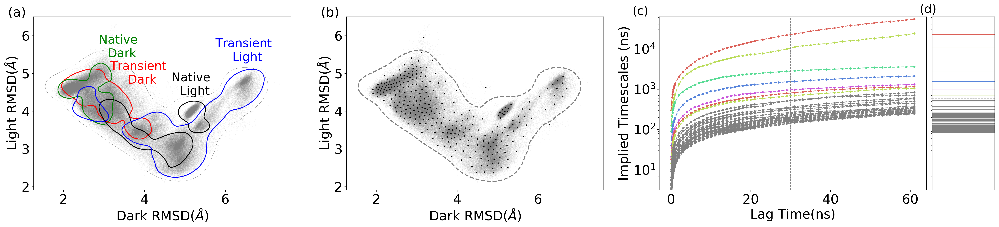

In [1]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import MiniBatchKMeans
from msmbuilder.io import load_trajs, save_trajs
from msmbuilder.msm import MarkovStateModel
import pandas as pd
import matplotlib.gridspec as gridspec
matplotlib.rcParams.update({'font.size':24})
label_size = 22

all_file = np.load('all.npz')
lu_con = all_file['lu_con']; lb_con = all_file['lb_con'];
db_con = all_file['db_con']; du_con = all_file['du_con'];
all_con = all_file['all_con'];

meta, clust_lagtime = load_trajs('kmeans-center')
msm = MarkovStateModel(lag_time=300, n_timescales=100, verbose=False)
msm.fit(list(clust_lagtime.values()))
timescale = msm.timescales_
print("LagTime: %dns percent_retained %.3f" %(30, msm.percent_retained_))

LagTime = pd.read_pickle('MSM_LagTime_Tuning.pickle')

timescale = msm.timescales_
uncertainty = msm.uncertainty_timescales()

colors = [(0.85999999999999999, 0.37119999999999997, 0.33999999999999997), 
          (0.72479999999999989, 0.85999999999999999, 0.33999999999999997),
          (0.33999999999999997, 0.85999999999999999, 0.57920000000000016), 
          (0.33999999999999997, 0.51679999999999948, 0.85999999999999999), 
          (0.7871999999999999, 0.33999999999999997, 0.85999999999999999)]


fig = plt.figure(figsize=(26,6),dpi=300)
gs = gridspec.GridSpec(1, 26)

ax = plt.subplot(gs[:,0:8])
for i in range(1):
    plt.plot(db_con[i][:,0],db_con[i][:,1], 'r-')
plt.text(3.9,5.0,'Transient \n Dark',ha='center',va='center',color='r',fontsize=label_size)
for i in range(1):
    plt.plot(du_con[i][:,0],du_con[i][:,1], 'g-')
plt.text(3.4,5.7,'Native \n Dark',ha='center',va='center',color='g',fontsize=label_size)
for i in range(2):
    plt.plot(lb_con[i][:,0],lb_con[i][:,1], 'k-')
plt.text(5.2,4.7,'Native \n Light',ha='center',va='center',color='k',fontsize=label_size)
for i in range(2):
    plt.plot(lu_con[i][:,0],lu_con[i][:,1], 'b-')
plt.text(6.5,5.6,'Transient \n Light',ha='center',va='center',color='b',fontsize=label_size)

for i in range(len(all_con)):
    plt.plot(all_con[i][:,0],all_con[i][:,1], '--',color='grey',lw=0.4)
    
plt.scatter(np.loadtxt('dcd/all_2pd7.dat',usecols=(1,)),
           np.loadtxt('dcd/all_3rh8.dat',usecols=(1,)), s=1, alpha=0.05, color='grey')

plt.xlabel(r'Dark RMSD$(\AA)$')
plt.ylabel(r'Light RMSD$(\AA)$')
plt.text(-0.1,1.00,'(a)',transform=ax.transAxes)

allx = np.loadtxt('dcd/all_2pd7.dat',usecols=(1,));
ally = np.loadtxt('dcd/all_3rh8.dat',usecols=(1,));
data = np.zeros((len(allx),2))
data[:,0] = allx; data[:,1] = ally

kmeans = MiniBatchKMeans(n_clusters=300, random_state=0)
labels = kmeans.fit_predict(data)
print(ax.get_xlim())
print(ax.get_ylim())

ax = plt.subplot(gs[:,8:16])
for i in range(len(all_con)):
    plt.plot(all_con[i][:,0],all_con[i][:,1], '--',color='grey',lw=2)
    
plt.scatter(np.loadtxt('dcd/all_2pd7.dat',usecols=(1,)),
           np.loadtxt('dcd/all_3rh8.dat',usecols=(1,)), s=1, alpha=0.05, color='grey')
plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],color='black',s=2)

plt.xlabel(r'Dark RMSD$(\AA)$')
plt.ylabel(r'Light RMSD$(\AA)$')
plt.text(-0.1,1.00,'(b)',transform=ax.transAxes)



gs00 = gridspec.GridSpecFromSubplotSpec(1, 10, subplot_spec=gs[:,16:])

ax = plt.subplot(gs00[:,0:8])
for i in range(0,7):
    color = colors[i % len(colors)]
    ax.plot(LagTime['LagTime'][:50]/10.0,LagTime['timescale_{}'.format(i)][:50], 'o--',color=color,ms=3)
for i in range(7,30):
    ax.plot(LagTime['LagTime'][:50]/10.0,LagTime['timescale_{}'.format(i)][:50], 'o--',color='grey',ms=3)
    
ax.set_yscale('log')
ax.set_xlabel('Lag Time(ns)')
ax.set_ylabel('Implied Timescales (ns)')
plt.axvline(x=30,ls='--',lw=1,color='grey')
plt.ylim([10**0.5,10**4.8])
plt.text(-0.10,1.01,'(c)',transform=ax.transAxes,fontsize=label_size)

ax = plt.subplot(gs00[:,8:10])
ax.set_yscale('log')
#colors = sns.color_palette("hls", 5)
colors = [(0.85999999999999999, 0.37119999999999997, 0.33999999999999997), 
          (0.72479999999999989, 0.85999999999999999, 0.33999999999999997), 
          (0.33999999999999997, 0.85999999999999999, 0.57920000000000016), 
          (0.33999999999999997, 0.51679999999999948, 0.85999999999999999), 
          (0.7871999999999999, 0.33999999999999997, 0.85999999999999999)]

for i, iterm in enumerate(zip(timescale, uncertainty)):
    time = iterm[0]; uncern=iterm[1];
    
    color = colors[i % len(colors)]
    if i > 6:
        color = 'grey'
    ax.errorbar([0, 1], [time, time], c=color, lw=1)
    ax.fill_between([0, 1], y1=[time - uncern, time - uncern],y2=[time + uncern, time + uncern], color=color, alpha=0.2)
    ax.xaxis.set_ticks([])
    ax.yaxis.set_ticks([])

plt.xlim([0,1])
plt.ylim([10**0.5,10**4.8])
plt.axhline(y=600,ls='--',lw=1,color='grey')
#plt.text(0.5,0.9,'Lag Time = 30ns\nImplied Timescales',transform=ax.transAxes,ha='center', va='center',fontsize=12)
plt.text(-0.20,1.02,'(d)',transform=ax.transAxes,fontsize=label_size)


gs.tight_layout(fig)
plt.savefig('Figure1_f.png',format='png')

LagTime: 30ns percent_retained 100.000


/users/hongyuz/software/anaconda3/lib/python3.5/site-packages/msmbuilder/msm/msm.py:567: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(sigma2)


(1.2620749726454035, 7.6222199076617825)
(1.9104743948950114, 6.5028226051049876)


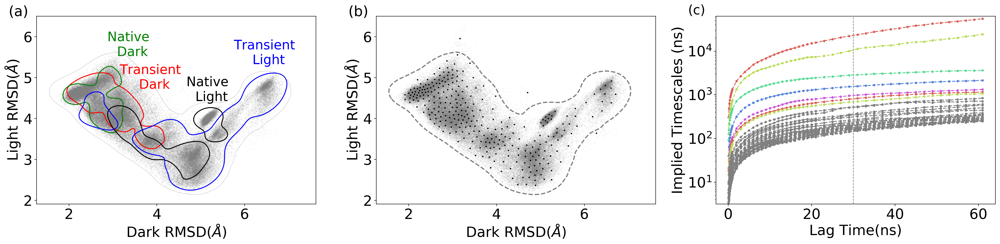

In [3]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import MiniBatchKMeans
from msmbuilder.io import load_trajs, save_trajs
from msmbuilder.msm import MarkovStateModel
import pandas as pd
import matplotlib.gridspec as gridspec
matplotlib.rcParams.update({'font.size':24})
label_size = 22

all_file = np.load('all.npz')
lu_con = all_file['lu_con']; lb_con = all_file['lb_con'];
db_con = all_file['db_con']; du_con = all_file['du_con'];
all_con = all_file['all_con'];

meta, clust_lagtime = load_trajs('kmeans-center')
msm = MarkovStateModel(lag_time=300, n_timescales=100, verbose=False)
msm.fit(list(clust_lagtime.values()))
timescale = msm.timescales_
print("LagTime: %dns percent_retained %.3f" %(30, msm.percent_retained_))

LagTime = pd.read_pickle('MSM_LagTime_Tuning.pickle')

timescale = msm.timescales_
uncertainty = msm.uncertainty_timescales()

colors = [(0.85999999999999999, 0.37119999999999997, 0.33999999999999997), 
          (0.72479999999999989, 0.85999999999999999, 0.33999999999999997),
          (0.33999999999999997, 0.85999999999999999, 0.57920000000000016), 
          (0.33999999999999997, 0.51679999999999948, 0.85999999999999999), 
          (0.7871999999999999, 0.33999999999999997, 0.85999999999999999)]


fig = plt.figure(figsize=(24,6),dpi=300)
ax = plt.subplot(1,3,1)
for i in range(1):
    plt.plot(db_con[i][:,0],db_con[i][:,1], 'r-')
plt.text(3.9,5.0,'Transient \n Dark',ha='center',va='center',color='r',fontsize=label_size)
for i in range(1):
    plt.plot(du_con[i][:,0],du_con[i][:,1], 'g-')
plt.text(3.4,5.8,'Native \n Dark',ha='center',va='center',color='g',fontsize=label_size)
for i in range(2):
    plt.plot(lb_con[i][:,0],lb_con[i][:,1], 'k-')
plt.text(5.2,4.7,'Native \n Light',ha='center',va='center',color='k',fontsize=label_size)
for i in range(2):
    plt.plot(lu_con[i][:,0],lu_con[i][:,1], 'b-')
plt.text(6.5,5.6,'Transient \n Light',ha='center',va='center',color='b',fontsize=label_size)

for i in range(len(all_con)):
    plt.plot(all_con[i][:,0],all_con[i][:,1], '--',color='grey',lw=0.4)
    
plt.scatter(np.loadtxt('dcd/all_2pd7.dat',usecols=(1,)),
           np.loadtxt('dcd/all_3rh8.dat',usecols=(1,)), s=1, alpha=0.05, color='grey')

plt.xlabel(r'Dark RMSD$(\AA)$')
plt.ylabel(r'Light RMSD$(\AA)$')
plt.text(-0.1,1.00,'(a)',transform=ax.transAxes)

allx = np.loadtxt('dcd/all_2pd7.dat',usecols=(1,));
ally = np.loadtxt('dcd/all_3rh8.dat',usecols=(1,));
data = np.zeros((len(allx),2))
data[:,0] = allx; data[:,1] = ally

kmeans = MiniBatchKMeans(n_clusters=300, random_state=0)
labels = kmeans.fit_predict(data)
print(ax.get_xlim())
print(ax.get_ylim())

ax = plt.subplot(1,3,2)
for i in range(len(all_con)):
    plt.plot(all_con[i][:,0],all_con[i][:,1], '--',color='grey',lw=2)
    
plt.scatter(np.loadtxt('dcd/all_2pd7.dat',usecols=(1,)),
           np.loadtxt('dcd/all_3rh8.dat',usecols=(1,)), s=1, alpha=0.05, color='grey')
plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],color='black',s=2)

plt.xlabel(r'Dark RMSD$(\AA)$')
plt.ylabel(r'Light RMSD$(\AA)$')
plt.text(-0.1,1.00,'(b)',transform=ax.transAxes)



ax = plt.subplot(1,3,3)
for i in range(0,7):
    color = colors[i % len(colors)]
    ax.plot(LagTime['LagTime'][:50]/10.0,LagTime['timescale_{}'.format(i)][:50], 'o--',color=color,ms=3)
for i in range(7,30):
    ax.plot(LagTime['LagTime'][:50]/10.0,LagTime['timescale_{}'.format(i)][:50], 'o--',color='grey',ms=3)
    
ax.set_yscale('log')
ax.set_xlabel('Lag Time(ns)')
ax.set_ylabel('Implied Timescales (ns)')
plt.axvline(x=30,ls='--',lw=1,color='grey')
plt.ylim([10**0.5,10**4.8])
plt.text(-0.10,1.01,'(c)',transform=ax.transAxes,fontsize=label_size)


plt.tight_layout()
plt.savefig('Figure1_f2.png',format='png')

In [1]:
%matplotlib inline
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams.update({'font.size':18})
import pandas as pd
from sklearn.externals import joblib
from msmbuilder.io import load_trajs, save_trajs

kmeans = joblib.load('kmeans-microstates.pkl') 
micro_macro = np.load('micro-macro-mapping.npy')
meta, macrostates = load_trajs('macro-mapping')
macrostates = np.concatenate(list(macrostates.values()))

all_file = np.load('all.npz')
lu_con = all_file['lu_con']; lb_con = all_file['lb_con'];
db_con = all_file['db_con']; du_con = all_file['du_con'];
all_con = all_file['all_con'];

allx= np.loadtxt('dcd/all_2pd7.dat',usecols=(1,));
ally= np.loadtxt('dcd/all_3rh8.dat',usecols=(1,));
contour = np.load('markov_contour.npy').item()

fig = plt.figure(figsize=(24,6),dpi=300)
matplotlib.rcParams.update({'font.size':24})
ax = plt.subplot(1,3,1)

for i in range(len(all_con)):
    plt.plot(all_con[i][:,0],all_con[i][:,1], '--',color='grey',lw=2)
    
plt.scatter(allx,ally , s=1, alpha=0.05, color='grey')

sfor i in range(300):
    plt.scatter(kmeans.cluster_centers_[:,0][i],kmeans.cluster_centers_[:,1][i],color=colors[micro_macro[i]],s=5)

plt.xlabel(r'Dark RMSD$(\AA)$')
plt.ylabel(r'Light RMSD$(\AA)$')
plt.text(-0.1,1.00,'(a)',transform=ax.transAxes)

ax = plt.subplot(1,3,2)
for i in range(len(all_con)):
    plt.plot(all_con[i][:,0],all_con[i][:,1], '--',color='grey',lw=2)

bbox_props = dict(boxstyle="round,pad=0.5", fc="white", ec="gray", lw=1)

macrostates = macrostates.astype(int)
colors = [(0.85999999999999999, 0.37119999999999997, 0.33999999999999997), 
          (0.85999999999999999, 0.7612000000000001, 0.33999999999999997), 
          (0.56880000000000008, 0.85999999999999999, 0.33999999999999997), 
          (0.33999999999999997, 0.85999999999999999, 0.50120000000000009), 
          (0.33999999999999997, 0.82879999999999987, 0.85999999999999999), 
          (0.33999999999999997, 0.43879999999999986, 0.85999999999999999), 
          (0.63119999999999976, 0.33999999999999997, 0.85999999999999999), 
          (0.85999999999999999, 0.33999999999999997, 0.69879999999999964)]



for i in range(8):
    cluster_x = allx[macrostates == i];
    cluster_y = ally[macrostates == i];
    average_x = np.mean(cluster_x);
    average_y = np.mean(cluster_y);
    
    plt.text(average_x,average_y,str(i+1),
             bbox=bbox_props,ha='center',va='center',fontsize=6)
    plt.scatter(cluster_x, cluster_y, color=colors[i], s=1, alpha=0.05 )
    
    for j in range(len(contour[i])):
        plt.plot(contour[i][j][:,0],contour[i][j][:,1],color=colors[i],ls='--',lw=2)
    
plt.xlabel(r'Dark RMSD$(\AA)$')
plt.ylabel(r'Light RMSD$(\AA)$')
plt.text(-0.1,1.00,'(b)',transform=ax.transAxes)

ax = plt.subplot(1,3,3)
for i in range(len(all_con)):
    plt.plot(all_con[i][:,0],all_con[i][:,1], '--',color='grey',lw=2)

bbox_props = dict(boxstyle="round,pad=0.5", fc="white", ec="gray", lw=1)

macrostates = macrostates.astype(int)
colors = [(0.85999999999999999, 0.37119999999999997, 0.33999999999999997), (0.85999999999999999, 0.7612000000000001, 0.33999999999999997), (0.56880000000000008, 0.85999999999999999, 0.33999999999999997), (0.33999999999999997, 0.85999999999999999, 0.50120000000000009), (0.33999999999999997, 0.82879999999999987, 0.85999999999999999), (0.33999999999999997, 0.43879999999999986, 0.85999999999999999), (0.63119999999999976, 0.33999999999999997, 0.85999999999999999), (0.85999999999999999, 0.33999999999999997, 0.69879999999999964)]



for i in range(8):
    cluster_x = allx[macrostates == i];
    cluster_y = ally[macrostates == i];
    average_x = np.mean(cluster_x);
    average_y = np.mean(cluster_y);
    
    plt.text(average_x,average_y,str(i+1),
             bbox=bbox_props,ha='center',va='center',fontsize=6)
    plt.scatter(cluster_x, cluster_y, color=colors[i], s=1, alpha=0.05 )
    
    for j in range(len(contour[i])):
        plt.plot(contour[i][j][:,0],contour[i][j][:,1],color=colors[i],ls='--',lw=2)
    
plt.xlabel(r'Dark RMSD$(\AA)$')
plt.ylabel(r'Light RMSD$(\AA)$')
plt.text(-0.1,1.00,'(c)',transform=ax.transAxes)


fig.tight_layout()
plt.savefig('Figure2_f.png')

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


/users/hongyuz/software/anaconda3/lib/python3.5/site-packages/sklearn/base.py:311: UserWarning: Trying to unpickle estimator MiniBatchKMeans from version 0.18.2 when using version 0.19.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


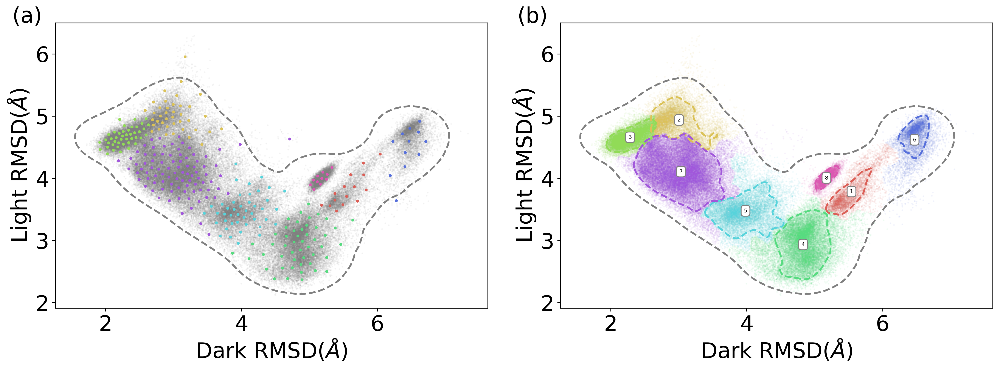

In [4]:
%matplotlib inline
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams.update({'font.size':18})
import pandas as pd
from sklearn.externals import joblib
from msmbuilder.io import load_trajs, save_trajs

kmeans = joblib.load('kmeans-microstates.pkl') 
micro_macro = np.load('micro-macro-mapping.npy')
meta, macrostates = load_trajs('macro-mapping')
macrostates = np.concatenate(list(macrostates.values()))

all_file = np.load('all.npz')
lu_con = all_file['lu_con']; lb_con = all_file['lb_con'];
db_con = all_file['db_con']; du_con = all_file['du_con'];
all_con = all_file['all_con'];

allx= np.loadtxt('dcd/all_2pd7.dat',usecols=(1,));
ally= np.loadtxt('dcd/all_3rh8.dat',usecols=(1,));
contour = np.load('markov_contour.npy').item()


colors = [(0.85999999999999999, 0.37119999999999997, 0.33999999999999997), 
          (0.85999999999999999, 0.7612000000000001, 0.33999999999999997), 
          (0.56880000000000008, 0.85999999999999999, 0.33999999999999997), 
          (0.33999999999999997, 0.85999999999999999, 0.50120000000000009), 
          (0.33999999999999997, 0.82879999999999987, 0.85999999999999999), 
          (0.33999999999999997, 0.43879999999999986, 0.85999999999999999), 
          (0.63119999999999976, 0.33999999999999997, 0.85999999999999999), 
          (0.85999999999999999, 0.33999999999999997, 0.69879999999999964)]

fig = plt.figure(figsize=(16,6),dpi=300)
matplotlib.rcParams.update({'font.size':24})
ax = plt.subplot(1,2,1)

for i in range(len(all_con)):
    plt.plot(all_con[i][:,0],all_con[i][:,1], '--',color='grey',lw=2)
    
plt.scatter(allx,ally , s=1, alpha=0.05, color='grey')

for i in range(300):
    plt.scatter(kmeans.cluster_centers_[:,0][i],kmeans.cluster_centers_[:,1][i],color=colors[micro_macro[i]],s=5)

plt.xlabel(r'Dark RMSD$(\AA)$')
plt.ylabel(r'Light RMSD$(\AA)$')
plt.text(-0.1,1.00,'(a)',transform=ax.transAxes)

ax = plt.subplot(1,2,2)
for i in range(len(all_con)):
    plt.plot(all_con[i][:,0],all_con[i][:,1], '--',color='grey',lw=2)

bbox_props = dict(boxstyle="round,pad=0.5", fc="white", ec="gray", lw=1)

macrostates = macrostates.astype(int)




for i in range(8):
    cluster_x = allx[macrostates == i];
    cluster_y = ally[macrostates == i];
    average_x = np.mean(cluster_x);
    average_y = np.mean(cluster_y);
    
    plt.text(average_x,average_y,str(i+1),
             bbox=bbox_props,ha='center',va='center',fontsize=6)
    plt.scatter(cluster_x, cluster_y, color=colors[i], s=1, alpha=0.05 )
    
    for j in range(len(contour[i])):
        plt.plot(contour[i][j][:,0],contour[i][j][:,1],color=colors[i],ls='--',lw=2)
    
plt.xlabel(r'Dark RMSD$(\AA)$')
plt.ylabel(r'Light RMSD$(\AA)$')
plt.text(-0.1,1.00,'(b)',transform=ax.transAxes)


fig.tight_layout()
plt.savefig('Figure2_f2.png')

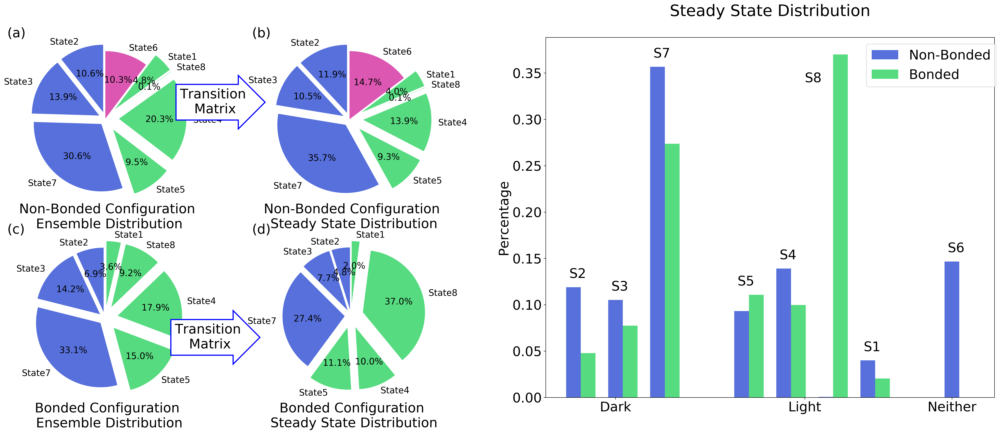

In [1]:
%matplotlib inline
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from msmbuilder.io import load_trajs, save_trajs
import matplotlib.gridspec as gridspec

matplotlib.rcParams.update({'font.size':24})

meta, macrostates = load_trajs('macro-mapping')
macro_unbound = np.concatenate(list(macrostates[i] for i in [0,1,2,9,10,11]))
macro_bound   = np.concatenate(list(macrostates[i] for i in [3,4,5,6,7,8]))
current_ligand_unbound = np.zeros(8)
current_ligand_bound = np.zeros(8)
for i in range(8):
    current_ligand_unbound[i] = np.sum(macro_unbound == i) / len(macro_unbound)
    current_ligand_bound[i]   = np.sum(macro_bound == i) / len(macro_bound)

def count_matrix(dictionaryx,lagtime,nstates):
    transition_count = np.zeros((nstates,nstates))
    transition_matrix = np.zeros((nstates,nstates))
    for i in range(len(dictionaryx)):
        dictionaryx[i] = dictionaryx[i].astype(int)
        for j in range(len(dictionaryx[i])-lagtime):
            transition_count[dictionaryx[i][j]][dictionaryx[i][j+lagtime]] += 1
    
    for i in range(nstates):
        for j in range(nstates):
            transition_matrix[i][j] = transition_count[i][j] / np.sum(transition_count[i])
            
    return (transition_count, transition_matrix)

transition_count, transition_matrix = count_matrix(macrostates,300,8)

ligand_unbound = [macrostates[i] for i in [0,1,2,9,10,11]]
ligand_bound = [macrostates[i] for i in [3,4,5,6,7,8]]
transition_count_unbound, transition_matrix_unbound = count_matrix(ligand_unbound,300,8)
transition_count_bound, transition_matrix_bound = count_matrix(ligand_bound,300,8)
transition_count, transition_matrix = count_matrix(macrostates,300,8)

transition_matrix_bound_s = np.linalg.matrix_power(transition_matrix_bound,1000)[0]
transition_matrix_unbound_s = np.linalg.matrix_power(transition_matrix_unbound,1000)[0]
    

idx = np.array([2,3,7,5,4,8,1,6])-1
labels = np.array(['State'+str(i+1) for i in idx])

explode1 = np.array([0.1,0.1,0.1,0.2,0.2,0.2,0.2,0])
colors = [(0.34, 0.4388, 0.86), 
          (0.34, 0.4388, 0.86), 
          (0.34, 0.4388, 0.86), 
          (0.34, 0.86, 0.5012),
          (0.34, 0.86, 0.5012),
          (0.34, 0.86, 0.5012),
          (0.34, 0.86, 0.5012),
          (0.86, 0.34, 0.6988)]

bbox_props = dict(boxstyle="rarrow", fc="white", ec="b", lw=2)
#----above data prepare

fig = plt.figure(figsize=(32,12),dpi=300)
gs0 = gridspec.GridSpec(1, 2)

gs00 = gridspec.GridSpecFromSubplotSpec(2,2, subplot_spec=gs0[0])
ax = plt.subplot(gs00[2])
ax.pie(current_ligand_bound[idx][current_ligand_bound[idx]>0.001], 
       labels=labels[current_ligand_bound[idx]>0.001], autopct='%1.1f%%', 
       explode=explode1[current_ligand_bound[idx]>0.001],
        startangle=90,colors=colors,textprops={'fontsize':16})
ax.axis('equal')
ax.set_xlabel('Bonded Configuration \nEnsemble Distribution')
ax.xaxis.set_label_coords(0.5,-0.03)
plt.text(0,1.00,'(c)',transform=ax.transAxes)

ax = plt.subplot(gs00[3])
ax.pie(transition_matrix_bound_s[idx][transition_matrix_bound_s[idx]>0.001], 
       labels=labels[transition_matrix_bound_s[idx]>0.001], autopct='%1.1f%%', 
       explode=explode1[transition_matrix_bound_s[idx]>0.001],
        startangle=90,colors=colors,textprops={'fontsize':16})
ax.axis('equal')
ax.set_xlabel('Bonded Configuration \nSteady State Distribution')
ax.xaxis.set_label_coords(0.5,-0.03)
t = ax.text(-2.3, -0.35, "Transition\n Matrix", ha="center", va="center", rotation=0,
            bbox=bbox_props)
plt.text(0,1.00,'(d)',transform=ax.transAxes)

ax = plt.subplot(gs00[0])
ax.pie(current_ligand_unbound[idx], labels=labels, autopct='%1.1f%%', explode=explode1,
        startangle=90,colors=colors,textprops={'fontsize':16})
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax.set_xlabel('Non-Bonded Configuration \nEnsemble Distribution')
plt.text(0,1.00,'(a)',transform=ax.transAxes)


ax = plt.subplot(gs00[1])
ax.pie(transition_matrix_unbound_s[idx], labels=labels, autopct='%1.1f%%', explode=explode1,
        startangle=90,colors=colors,textprops={'fontsize':16})
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax.set_xlabel('Non-Bonded Configuration \nSteady State Distribution')
plt.text(0,1.00,'(b)',transform=ax.transAxes)

t = ax.text(-2.0, 0.25, "Transition\n Matrix", ha="center", va="center", rotation=0,
            bbox=bbox_props)
 
ax = plt.subplot(gs0[1])

N = 8
ind = np.array([0,1,2,4,5,6,7,9])  # the x locations for the groups
width = 0.35       # the width of the bars

idx = np.array([2,3,7,5,4,8,1,6])-1
labels = np.array(['S'+str(i+1) for i in idx])
colors = [(0.34, 0.4388, 0.86), 
          (0.34, 0.4388, 0.86), 
          (0.34, 0.4388, 0.86), 
          (0.34, 0.86, 0.5012),
          (0.34, 0.86, 0.5012),
          (0.34, 0.86, 0.5012),
          (0.34, 0.86, 0.5012),
          (0.86, 0.34, 0.6988)]


rects1 = ax.bar(ind, transition_matrix_unbound_s[idx], width, color=(0.34, 0.4388, 0.86))
rects2 = ax.bar(ind + width, transition_matrix_bound_s[idx], width, color=(0.34, 0.86, 0.5012))

# add some text for labels, title and axes ticks
ax.set_ylabel('Percentage')
for i in range(8):
    if (i!=5):
        plt.text(ind[i]-0.1, np.max([transition_matrix_unbound_s[idx][i], transition_matrix_bound_s[idx][i]])+0.01,
            'S'+str(idx[i]+1))
    else:
        plt.text(ind[i]-0.5, np.max([transition_matrix_unbound_s[idx][i], transition_matrix_bound_s[idx][i]])-0.03,
                 'S'+str(idx[i]+1))

ax.set_xticks([1,5.5,9])
ax.set_xticklabels(['Dark','Light','Neither'])

ax.legend((rects1[0], rects2[0]), ('Non-Bonded', 'Bonded'), bbox_to_anchor=(0.7,1))
ax.set_title("Steady State Distribution",y=1)


    
plt.savefig("Figure4_f.png")

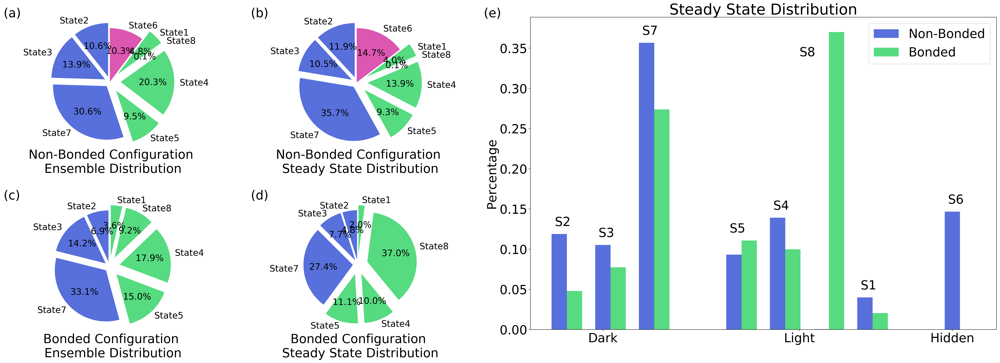

In [14]:
matplotlib.rcParams.update({'font.size':28})
label_size=20

idx = np.array([2,3,7,5,4,8,1,6])-1
labels = np.array(['State'+str(i+1) for i in idx])

explode1 = np.array([0.1,0.1,0.1,0.2,0.2,0.2,0.2,0])
colors = [(0.34, 0.4388, 0.86), 
          (0.34, 0.4388, 0.86), 
          (0.34, 0.4388, 0.86), 
          (0.34, 0.86, 0.5012),
          (0.34, 0.86, 0.5012),
          (0.34, 0.86, 0.5012),
          (0.34, 0.86, 0.5012),
          (0.86, 0.34, 0.6988)]

bbox_props = dict(boxstyle="rarrow", fc="white", ec="b", lw=2)

fig = plt.figure(figsize=(32,12),dpi=300)
gs0 = gridspec.GridSpec(1, 2)

gs00 = gridspec.GridSpecFromSubplotSpec(2,2, subplot_spec=gs0[0], hspace=0.4)
ax = plt.subplot(gs00[2])
ax.pie(current_ligand_bound[idx][current_ligand_bound[idx]>0.001], 
       labels=labels[current_ligand_bound[idx]>0.001], autopct='%1.1f%%', 
       explode=explode1[current_ligand_bound[idx]>0.001],
        startangle=90,colors=colors,textprops={'fontsize':label_size})
ax.axis('equal')
ax.set_xlabel('Bonded Configuration \nEnsemble Distribution')
ax.xaxis.set_label_coords(0.5,-0.03)
plt.text(0,1.00,'(c)',transform=ax.transAxes)

ax = plt.subplot(gs00[3])
ax.pie(transition_matrix_bound_s[idx][transition_matrix_bound_s[idx]>0.001], 
       labels=labels[transition_matrix_bound_s[idx]>0.001], autopct='%1.1f%%', 
       explode=explode1[transition_matrix_bound_s[idx]>0.001],
        startangle=90,colors=colors,textprops={'fontsize':label_size})
ax.axis('equal')
ax.set_xlabel('Bonded Configuration \nSteady State Distribution')
ax.xaxis.set_label_coords(0.5,-0.03)
#t = ax.text(-2.3, -0.35, "Transition\n Matrix", ha="center", va="center", rotation=0,
#            bbox=bbox_props)
plt.text(0,1.00,'(d)',transform=ax.transAxes)

ax = plt.subplot(gs00[0])
ax.pie(current_ligand_unbound[idx], labels=labels, autopct='%1.1f%%', explode=explode1,
        startangle=90,colors=colors,textprops={'fontsize':label_size})
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax.set_xlabel('Non-Bonded Configuration \nEnsemble Distribution')
plt.text(0,1.00,'(a)',transform=ax.transAxes)


ax = plt.subplot(gs00[1])
ax.pie(transition_matrix_unbound_s[idx], labels=labels, autopct='%1.1f%%', explode=explode1,
        startangle=90,colors=colors,textprops={'fontsize':label_size})
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax.set_xlabel('Non-Bonded Configuration \nSteady State Distribution')
plt.text(0,1.00,'(b)',transform=ax.transAxes)

#t = ax.text(-2.0, 0.25, "Transition\n Matrix", ha="center", va="center", rotation=0,
#            bbox=bbox_props)
 
ax = plt.subplot(gs0[1])
idx = np.array([2,3,7,5,4,8,1,6])-1
labels = np.array(['S'+str(i+1) for i in idx])

rects1 = ax.bar(ind, transition_matrix_unbound_s[idx], width, color=(0.34, 0.4388, 0.86))
rects2 = ax.bar(ind + width, transition_matrix_bound_s[idx], width, color=(0.34, 0.86, 0.5012))

# add some text for labels, title and axes ticks
ax.set_ylabel('Percentage')
for i in range(8):
    if (i!=5):
        plt.text(ind[i]-0.1, np.max([transition_matrix_unbound_s[idx][i], transition_matrix_bound_s[idx][i]])+0.01,
            'S'+str(idx[i]+1))
    else:
        plt.text(ind[i]-0.5, np.max([transition_matrix_unbound_s[idx][i], transition_matrix_bound_s[idx][i]])-0.03,
                 'S'+str(idx[i]+1))

ax.set_xticks([1,5.5,9])
ax.set_xticklabels(['Dark','Light','Hidden'])

ax.legend((rects1[0], rects2[0]), ('Non-Bonded', 'Bonded'))#, bbox_to_anchor=(0.7,1))
ax.set_title("Steady State Distribution",y=1)
plt.text(-0.1,1.00,'(e)',transform=ax.transAxes)

fig.tight_layout()
plt.savefig('Figure4_f.png')

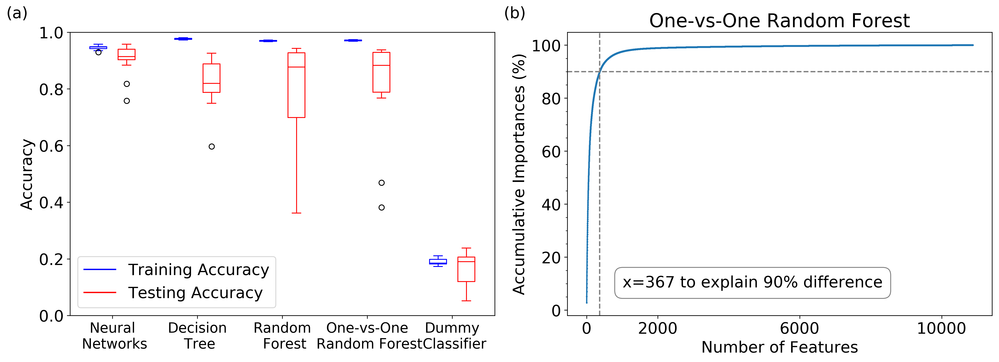

In [8]:
%matplotlib inline
import matplotlib as mpl
from matplotlib.artist import setp
mpl.rcParams.update({'font.size':18})
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def read_log(file):
    data = []
    for line in open(file):
        l = line.strip('\n').split()
        data += [{'fold': int(l[1]),
                'depth': float(l[3]),
                'train_accu': float(l[6]),
                'test_accu': float(l[9])}]
    data = pd.DataFrame(data)
    median = data.groupby("depth").aggregate(np.median)
    std = data.groupby("depth").aggregate(np.std)
    mean = data.groupby("depth").aggregate(np.mean)
    return (data, median, std, mean)
    
nn_data, nn_median, nn_std, nn_mean = read_log("model_selection/NeuralNetwork.log");
dt_data, dt_median, dt_std, dt_mean = read_log("model_selection/DecisionTree.log");
rf_data, rf_median, rf_std, rf_mean = read_log("model_selection/RandomForest.log");
ovorf_data, ovorf_median, ovorf_std, ovorf_mean = read_log("model_selection/OvO-RandomForest.log");

def setBoxColors(bp):
    setp(bp['boxes'][0], color='blue')
    setp(bp['caps'][0], color='blue')
    setp(bp['caps'][1], color='blue')
    setp(bp['whiskers'][0], color='blue')
    setp(bp['whiskers'][1], color='blue')
    setp(bp['fliers'][0], color='blue')
    #setp(bp['fliers'][1], color='blue')
    setp(bp['medians'][0], color='blue')

    setp(bp['boxes'][1], color='red')
    setp(bp['caps'][2], color='red')
    setp(bp['caps'][3], color='red')
    setp(bp['whiskers'][2], color='red')
    setp(bp['whiskers'][3], color='red')
    setp(bp['fliers'][1], color='red')
    #setp(bp['fliers'][3], color='red')
    setp(bp['medians'][1], color='red')

fig = plt.figure(dpi=300,figsize=(16,6))
ax = plt.subplot(1,2,1)
data = [np.array(nn_data[nn_data['depth'] == -4]['train_accu']),
         np.array(nn_data[nn_data['depth'] == -4]['test_accu'])]
bp = plt.boxplot(data, positions = [1, 2], widths = 0.6)
setBoxColors(bp)

data = [np.array(dt_data[dt_data['depth'] == 13]['train_accu']),
         np.array(dt_data[dt_data['depth'] == 13]['test_accu'])]
bp = plt.boxplot(data, positions = [4, 5], widths = 0.6)
setBoxColors(bp)

data = [np.array(rf_data[rf_data['depth'] == 12]['train_accu']),
         np.array(rf_data[rf_data['depth'] == 12]['test_accu'])]
bp = plt.boxplot(data, 0, positions = [7, 8], widths = 0.6)
setBoxColors(bp)

data = [np.array(ovorf_data[ovorf_data['depth'] == 9]['train_accu']),
         np.array(ovorf_data[ovorf_data['depth'] == 9]['test_accu'])]
bp = plt.boxplot(data, 0, positions = [10, 11], widths = 0.6)
setBoxColors(bp)

data = [np.loadtxt("Dummy.log", usecols=(4,)),
       np.loadtxt("Dummy.log", usecols=(7,)),]
bp = plt.boxplot(data, 0, positions = [13, 14], widths = 0.6)
setBoxColors(bp)

ax.set_xlim(0,15)
ax.set_ylim(0,1)
ax.set_xticklabels(['Neural\n Networks', 'Decision\n Tree','Random\n Forest','One-vs-One\n Random Forest','Dummy\n Classifier'],fontsize=16)
ax.set_xticks([1.5, 4.5, 7.5,10.5, 13.5])

hB, = plt.plot([1,1],'b-')
hR, = plt.plot([1,1],'r-')
plt.legend((hB, hR),('Training Accuracy', 'Testing Accuracy'))
hB.set_visible(False)
hR.set_visible(False)

plt.ylabel("Accuracy")
plt.text(-0.15,1.05,'(a)',transform=ax.transAxes)

bbox_props = dict(boxstyle="round,pad=0.5", fc="white", ec="gray", lw=1)

from sklearn.externals import joblib

clf = joblib.load('ovo-randomforest/final_9.pkl')
feature_imp = np.zeros(len(clf.estimators_[0].feature_importances_))
for es in clf.estimators_:
    feature_imp += es.feature_importances_ 
feature_imp = feature_imp/len(clf.estimators_)
feature_imp_array = np.array([[i,v] for i,v in enumerate(feature_imp*100)])
feature_imp_array_sort = feature_imp_array[feature_imp_array[:,1].argsort()]

feature_imp_sort = np.zeros(len(feature_imp_array_sort[::-1][:,1]))
feature_imp_sort[0] = feature_imp_array_sort[::-1][:,1][0]
for i in range(1,len(feature_imp_sort)):
    feature_imp_sort[i] = feature_imp_sort[i-1] + feature_imp_array_sort[::-1][:,1][i]

ax = plt.subplot(1,2,2)
plt.plot(np.arange(len(feature_imp_sort)), feature_imp_sort,'o-',ms=1)
plt.xlabel("Number of Features")
plt.ylabel("Accumulative Importances (%)")
plt.axvline(x=367,ls='--',color='grey')
plt.axhline(y=90,ls='--',color='grey')
plt.text(0.13,0.1,"x=367 to explain 90% difference", bbox=bbox_props,transform=ax.transAxes)

#plt.yticks(np.arange(0,105,10))
ax.set_yticks(np.arange(0,105,5), minor = True)
ax.set_xticks([0,2000,6000,10000])
ax.set_title('One-vs-One Random Forest')
plt.text(-0.15,1.05,'(b)',transform=ax.transAxes)

fig.tight_layout()
plt.savefig('Figure6_f.png')

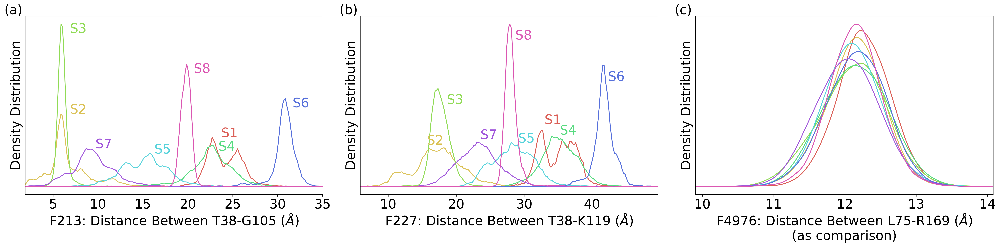

In [6]:
%matplotlib inline
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsOneClassifier
from msmbuilder.io import load_meta, load_trajs
import sys
from sklearn.externals import joblib
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity

#meta, all_data  = load_trajs('alpha_carbon/')
#meta, all_label = load_trajs('macro-mapping/')
#all_data_one = np.concatenate(list(all_data.values()))
#all_label_one = np.concatenate(list(all_label.values()))
#all_feature_sort = pd.read_pickle("Sorted_Feature_Imp.pickle")
#del all_data, meta, all_label


mpl.rcParams.update({'font.size':22})
colors = [(0.85999999999999999, 0.37119999999999997, 0.33999999999999997), (0.85999999999999999, 0.7612000000000001, 0.33999999999999997), (0.56880000000000008, 0.85999999999999999, 0.33999999999999997), (0.33999999999999997, 0.85999999999999999, 0.50120000000000009), (0.33999999999999997, 0.82879999999999987, 0.85999999999999999), (0.33999999999999997, 0.43879999999999986, 0.85999999999999999), (0.63119999999999976, 0.33999999999999997, 0.85999999999999999), (0.85999999999999999, 0.33999999999999997, 0.69879999999999964)]


fig = plt.figure(figsize=(24,6),dpi=300)
ax=plt.subplot(1,3,1)

n=213
curr_data = np.zeros((8,200))
fs_data = all_data_one[:,n] * 10;
fs_data = all_data_one[:,n] * 10;

xs = np.linspace(np.min(fs_data),np.max(fs_data),200)[:, np.newaxis]

for i in range(8):
    data = fs_data[all_label_one==i][:, np.newaxis]
    kde = KernelDensity(kernel='gaussian', bandwidth=0.1).fit(data)
    log_dens = kde.score_samples(xs)
    curr_data[i] =  log_dens
    plt.plot(xs,np.exp(log_dens),label='S'+str(i+1),color=colors[i])
    if (i==2):
        plt.text(xs[np.argmax(log_dens)]+1, np.exp(log_dens)[np.argmax(log_dens)]-0.05,'S'+str(i+1),color=colors[i])
    elif (i==3):
        plt.text(xs[np.argmax(log_dens)]+0.7, np.exp(log_dens)[np.argmax(log_dens)]-0.03,'S'+str(i+1),color=colors[i])
    elif (i==4):
        plt.text(xs[np.argmax(log_dens)]+0.4, np.exp(log_dens)[np.argmax(log_dens)],'S'+str(i+1),color=colors[i])
    elif (i==7):
        plt.text(xs[np.argmax(log_dens)]+0.8, np.exp(log_dens)[np.argmax(log_dens)]-0.05,'S'+str(i+1),color=colors[i])
    elif (i==5):
        plt.text(xs[np.argmax(log_dens)]+0.8, np.exp(log_dens)[np.argmax(log_dens)]-0.05,'S'+str(i+1),color=colors[i])
    else:
        plt.text(xs[np.argmax(log_dens)]+1, np.exp(log_dens)[np.argmax(log_dens)],'S'+str(i+1),color=colors[i])
plt.xlim([np.min(fs_data),np.max(fs_data)])
plt.yticks([])
plt.ylabel("Density Distribution")
plt.xlabel(r"F213: Distance Between T38-G105 ($\AA$)")
plt.text(-0.07,1.01,'(a)',transform=ax.transAxes)

ax=plt.subplot(1,3,2)
n=227
fs_data = all_data_one[:,n] * 10;

xs = np.linspace(np.min(fs_data),np.max(fs_data),200)[:, np.newaxis]

for i in range(8):
    data = fs_data[all_label_one==i][:, np.newaxis]
    kde = KernelDensity(kernel='gaussian', bandwidth=0.13).fit(data)
    log_dens = kde.score_samples(xs)
    curr_data[i] =  log_dens
    plt.plot(xs,np.exp(log_dens),label='S'+str(i+1),color=colors[i])
    if (i==2):
        plt.text(xs[np.argmax(log_dens)]+1.3, np.exp(log_dens)[np.argmax(log_dens)]-0.05,'S'+str(i+1),color=colors[i])
    elif (i==3):
        plt.text(xs[np.argmax(log_dens)]+1.2, np.exp(log_dens)[np.argmax(log_dens)]+0.005,'S'+str(i+1),color=colors[i])
    elif (i==4):
        plt.text(xs[np.argmax(log_dens)]+1.0, np.exp(log_dens)[np.argmax(log_dens)],'S'+str(i+1),color=colors[i])
    elif (i==7):
        plt.text(xs[np.argmax(log_dens)]+0.8, np.exp(log_dens)[np.argmax(log_dens)]-0.05,'S'+str(i+1),color=colors[i])
    elif (i==5):
        plt.text(xs[np.argmax(log_dens)]+0.8, np.exp(log_dens)[np.argmax(log_dens)]-0.05,'S'+str(i+1),color=colors[i])
    elif (i==1):
        plt.text(xs[np.argmax(log_dens)]-2.5, np.exp(log_dens)[np.argmax(log_dens)]+0.01,'S'+str(i+1),color=colors[i])
    elif (i==6):
        plt.text(xs[np.argmax(log_dens)]+0.5, np.exp(log_dens)[np.argmax(log_dens)]+0.01,'S'+str(i+1),color=colors[i])
    elif (i==0):
        plt.text(xs[np.argmax(log_dens)]+0.5, np.exp(log_dens)[np.argmax(log_dens)]+0.02,'S'+str(i+1),color=colors[i])
    else:
        plt.text(xs[np.argmax(log_dens)]+1, np.exp(log_dens)[np.argmax(log_dens)],'S'+str(i+1),color=colors[i])
plt.xlim([np.min(fs_data),np.max(fs_data)])
plt.yticks([])
plt.ylabel("Density Distribution")
plt.xlabel(r"F227: Distance Between T38-K119 ($\AA$)")
plt.text(-0.07,1.01,'(b)',transform=ax.transAxes)

ax=plt.subplot(1,3,3)
n=4976
curr_data = np.zeros((8,200))
fs_data = all_data_one[:,n] * 10;

xs = np.linspace(np.min(fs_data),np.max(fs_data),200)[:, np.newaxis]

for i in range(8):
    data = fs_data[all_label_one==i][:, np.newaxis]
    kde = KernelDensity(kernel='gaussian', bandwidth=0.1).fit(data)
    log_dens = kde.score_samples(xs)
    curr_data[i] =  log_dens
    plt.plot(xs,np.exp(log_dens),label='S'+str(i+1),color=colors[i])
    #plt.text(xs[np.argmax(log_dens)]+1, np.exp(log_dens)[np.argmax(log_dens)],'S'+str(i+1),color=colors[i])
plt.xlim([np.min(fs_data),np.max(fs_data)])
plt.yticks([])
plt.ylabel("Density Distribution")
plt.xlabel(r"F4976: Distance Between L75-R169 ($\AA$)"+"\n(as comparison)")
plt.xticks([10,11,12,13,14])
plt.text(-0.07,1.01,'(c)',transform=ax.transAxes)

plt.tight_layout()
plt.savefig("Figure7_f.png")

/users/hongyuz/software/anaconda3/lib/python3.5/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


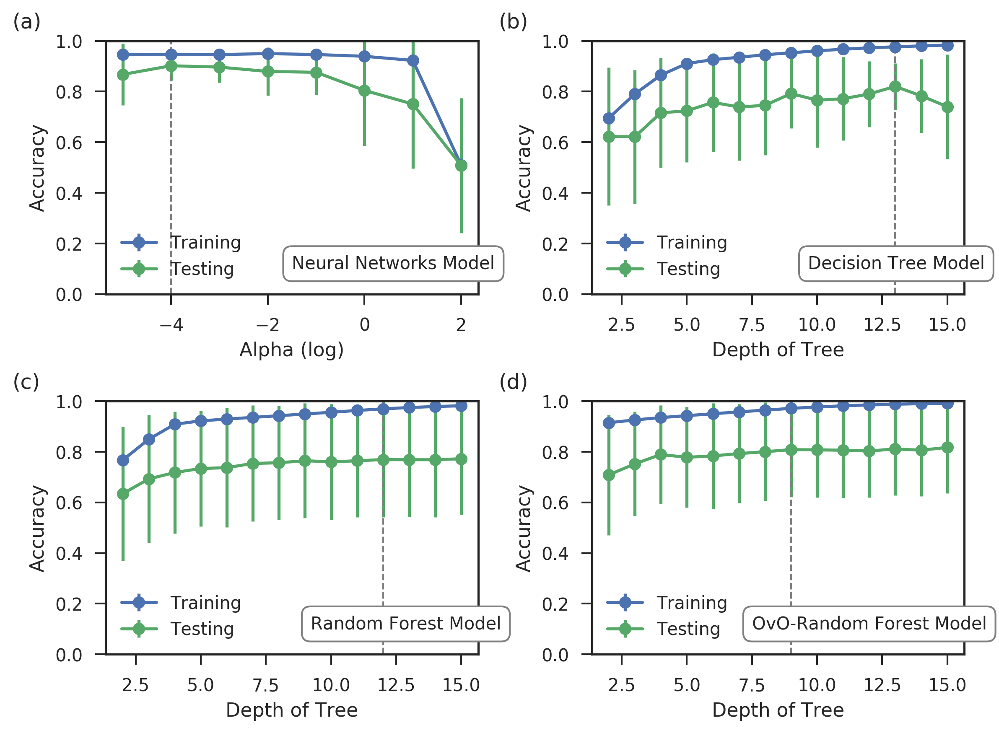

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set_style('ticks')
current_palette = sns.color_palette()

def read_log(file):
    data = []
    for line in open(file):
        l = line.strip('\n').split()
        data += [{'fold': int(l[1]),
                'depth': float(l[3]),
                'train_accu': float(l[6]),
                'test_accu': float(l[9])}]
    data = pd.DataFrame(data)
    median = data.groupby("depth").aggregate(np.median)
    std = data.groupby("depth").aggregate(np.std)
    mean = data.groupby("depth").aggregate(np.mean)
    return (data, median, std, mean)
    
nn_data, nn_median, nn_std, nn_mean = read_log("model_selection/NeuralNetwork.log");
dt_data, dt_median, dt_std, dt_mean = read_log("model_selection/DecisionTree.log");
rf_data, rf_median, rf_std, rf_mean = read_log("model_selection/RandomForest.log");
ovorf_data, ovorf_median, ovorf_std, ovorf_mean = read_log("model_selection/OvO-RandomForest.log");

%matplotlib inline
import matplotlib as mpl
mpl.rcParams.update({'font.size':18})

import matplotlib.pyplot as plt
bbox_props = dict(boxstyle="round,pad=0.5", fc="white", ec="gray", lw=1)
fig = plt.figure(figsize=(8,6),dpi=300)
ax = plt.subplot(2,2,1)
plt.errorbar(np.array(nn_mean.index), np.array(nn_mean['train_accu']), yerr=np.array(nn_std['train_accu']),fmt='o-',label='Training')
plt.errorbar(np.array(nn_mean.index), np.array(nn_mean['test_accu']), yerr=np.array(nn_std['test_accu']),fmt='o-',label='Testing')
plt.ylim([0,1])
plt.xlabel('Alpha (log)')
plt.ylabel('Accuracy')
plt.text(0.50,0.1,'Neural Networks Model',ha='left',bbox=bbox_props,transform=ax.transAxes,fontsize=10)
plt.axvline(x=-4,ls='--',lw=1,color='grey')
plt.legend(loc=3)
plt.text(-0.25,1.05,'(a)',transform=ax.transAxes,fontsize=12)

ax = plt.subplot(2,2,2)
plt.errorbar(np.array(dt_mean.index), np.array(dt_mean['train_accu']), yerr=np.array(dt_std['train_accu']),fmt='o-',label='Training')
plt.errorbar(np.array(dt_mean.index), np.array(dt_mean['test_accu']), yerr=np.array(dt_std['test_accu']),fmt='o-',label='Testing')
plt.ylim([0,1])
plt.xlabel('Depth of Tree')
plt.ylabel('Accuracy')
plt.text(0.58,0.1,'Decision Tree Model',ha='left',bbox=bbox_props,transform=ax.transAxes,fontsize=10)
plt.axvline(x=13,ls='--',lw=1,color='grey')
plt.legend(loc=3)
plt.text(-0.25,1.05,'(b)',transform=ax.transAxes,fontsize=12)

ax = plt.subplot(2,2,3)
plt.errorbar(np.array(rf_mean.index), np.array(rf_mean['train_accu']), yerr=np.array(rf_std['train_accu']),fmt='o-',label='Training')
plt.errorbar(np.array(rf_mean.index), np.array(rf_mean['test_accu']), yerr=np.array(rf_std['test_accu']),fmt='o-',label='Testing')
plt.ylim([0,1])
plt.xlabel('Depth of Tree')
plt.ylabel('Accuracy')
plt.text(0.55,0.1,'Random Forest Model',ha='left',bbox=bbox_props,transform=ax.transAxes,fontsize=10)
plt.axvline(x=12,ls='--',lw=1,color='grey')
plt.legend(loc=3)
plt.text(-0.25,1.05,'(c)',transform=ax.transAxes,fontsize=12)

ax = plt.subplot(2,2,4)
plt.errorbar(np.array(ovorf_mean.index), np.array(ovorf_mean['train_accu']), yerr=np.array(ovorf_std['train_accu']),fmt='o-',label='Training')
plt.errorbar(np.array(ovorf_mean.index), np.array(ovorf_mean['test_accu']), yerr=np.array(ovorf_std['test_accu']),fmt='o-',label='Testing')
plt.ylim([0,1])
plt.xlabel('Depth of Tree')
plt.ylabel('Accuracy')
plt.legend(loc=3)
plt.text(0.43,0.1,'OvO-Random Forest Model',ha='left',bbox=bbox_props,transform=ax.transAxes,fontsize=10)
plt.axvline(x=9,ls='--',lw=1,color='grey')
plt.text(-0.25,1.05,'(d)',transform=ax.transAxes,fontsize=12)

plt.tight_layout()
plt.savefig('Figure5_f.png')